In [1]:
# Import libraries 
import sqlite3
import numpy as np
import pandas as pd
from time import time
import math
import seaborn as sns
import csv
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches


In [2]:
# connect to the accident db
connect= sqlite3.connect('accident_data_v1.0.0_2023.db')
cur= connect.cursor() 

In [3]:
# Execute the PRAGMA statement to get column details for the 'accident' table.
col_info= cur.execute(f'PRAGMA table_info(accident)')
# Fetch all the column information as a list of tuples.

In [4]:
# Extract column names and store them in the 'column_names' variable.
column_names= [column_name[1] for column_name in col_info.fetchall()]
column_names

['accident_index',
 'accident_year',
 'accident_reference',
 'location_easting_osgr',
 'location_northing_osgr',
 'longitude',
 'latitude',
 'police_force',
 'accident_severity',
 'number_of_vehicles',
 'number_of_casualties',
 'date',
 'day_of_week',
 'time',
 'local_authority_district',
 'local_authority_ons_district',
 'local_authority_highway',
 'first_road_class',
 'first_road_number',
 'road_type',
 'speed_limit',
 'junction_detail',
 'junction_control',
 'second_road_class',
 'second_road_number',
 'pedestrian_crossing_human_control',
 'pedestrian_crossing_physical_facilities',
 'light_conditions',
 'weather_conditions',
 'road_surface_conditions',
 'special_conditions_at_site',
 'carriageway_hazards',
 'urban_or_rural_area',
 'did_police_officer_attend_scene_of_accident',
 'trunk_road_flag',
 'lsoa_of_accident_location']

In [5]:
 # Execute the SQL query to select all data from the 'accident' table.
data= cur.execute("select * from accident").fetchall()
data

[('2017010001708',
  2017,
  '010001708',
  532920.0,
  196330.0,
  -0.080107,
  51.650061,
  1,
  1,
  2,
  3,
  '05/08/2017',
  7,
  '03:12',
  32,
  'E09000010',
  'E09000010',
  3,
  105,
  6,
  30,
  0,
  -1,
  -1,
  -1,
  0,
  0,
  4,
  1,
  1,
  0,
  0,
  1,
  1,
  2,
  'E01001450'),
 ('2017010009342',
  2017,
  '010009342',
  526790.0,
  181970.0,
  -0.173845,
  51.522425,
  1,
  3,
  2,
  1,
  '01/01/2017',
  1,
  '01:30',
  1,
  'E09000033',
  'E09000033',
  3,
  5,
  6,
  30,
  3,
  4,
  6,
  0,
  0,
  0,
  4,
  1,
  2,
  0,
  0,
  1,
  1,
  2,
  'E01004702'),
 ('2017010009344',
  2017,
  '010009344',
  535200.0,
  181260.0,
  -0.052969,
  51.514096,
  1,
  3,
  3,
  1,
  '01/01/2017',
  1,
  '00:30',
  5,
  'E09000030',
  'E09000030',
  3,
  13,
  6,
  30,
  3,
  4,
  5,
  0,
  0,
  0,
  4,
  1,
  1,
  0,
  0,
  1,
  1,
  2,
  'E01004298'),
 ('2017010009348',
  2017,
  '010009348',
  534340.0,
  193560.0,
  -0.060658,
  51.624832,
  1,
  3,
  2,
  1,
  '01/01/2017',
  1,
  

ACCIDENT

In [6]:
# Create a DataFrame using pandas and pass the 'data' list of tuples.
accident_df= pd.DataFrame(data,columns= column_names)
accident_df

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2017010001708,2017,010001708,532920.0,196330.0,-0.080107,51.650061,1,1,2,...,0,4,1,1,0,0,1,1,2,E01001450
1,2017010009342,2017,010009342,526790.0,181970.0,-0.173845,51.522425,1,3,2,...,0,4,1,2,0,0,1,1,2,E01004702
2,2017010009344,2017,010009344,535200.0,181260.0,-0.052969,51.514096,1,3,3,...,0,4,1,1,0,0,1,1,2,E01004298
3,2017010009348,2017,010009348,534340.0,193560.0,-0.060658,51.624832,1,3,2,...,4,4,2,2,0,0,1,1,2,E01001429
4,2017010009350,2017,010009350,533680.0,187820.0,-0.072372,51.573408,1,2,1,...,5,4,1,2,0,0,1,1,2,E01001808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461347,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,0,1,1,1,0,0,1,1,-1,-1
461348,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,0,1,1,1,0,0,1,2,-1,-1
461349,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,0,1,1,1,0,0,2,1,-1,-1
461350,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,0,1,1,1,0,0,1,2,-1,-1


In [7]:
accident_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 461352 entries, 0 to 461351
Data columns (total 36 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   accident_index                               461352 non-null  object 
 1   accident_year                                461352 non-null  int64  
 2   accident_reference                           461352 non-null  object 
 3   location_easting_osgr                        461236 non-null  float64
 4   location_northing_osgr                       461236 non-null  float64
 5   longitude                                    461226 non-null  float64
 6   latitude                                     461226 non-null  float64
 7   police_force                                 461352 non-null  int64  
 8   accident_severity                            461352 non-null  int64  
 9   number_of_vehicles                           461352 non-nul

### ACCIDENT

The accident data includes key attributes such as location, condition, date, road type, speed limit, junction details and control, and information about the affected vehicles and casualties. All these attributes are coded as numbers and can be mapped to lookup tables for better analysis and understanding.

In [8]:
# Use the describe() function to get the summary statistics for the numerical columns in the DataFrame.
# The T (transpose) function is used to switch rows and columns for a more readable output.
accident_df.describe().T

,count,mean,std,min,25%,50%,75%,max
accident_year,461352.0,2018.368378,1.091566,2017.000000,2017.000000,2018.000000,2019.000000,2.020000e+03
location_easting_osgr,461236.0,452593.115756,94822.718705,64084.000000,388539.000000,459198.500000,529290.000000,6.553910e+05
location_northing_osgr,461236.0,280180.282096,151550.132556,10235.000000,175530.000000,220865.000000,386551.000000,1.209512e+06
longitude,461226.0,-1.246998,1.389702,-7.525273,-2.172668,-1.126264,-0.136389,1.759641e+00
latitude,461226.0,52.408849,1.365101,49.912362,51.465689,51.870257,53.372899,6.076372e+01
police_force,461352.0,28.193388,24.801609,1.000000,5.000000,22.000000,45.000000,9.900000e+01
accident_severity,461352.0,2.784436,0.443648,1.000000,3.000000,3.000000,3.000000,3.000000e+00
number_of_vehicles,461352.0,1.840441,0.709869,1.000000,1.000000,2.000000,2.000000,2.400000e+01
number_of_casualties,461352.0,1.301245,0.746398,1.000000,1.000000,1.000000,1.000000,5.900000e+01
day_of_week,461352.0,4.108171,1.927216,1.000000,2.000000,4.000000,6.000000,7.000000e+00


### VEHICLE

In [9]:
# Execute the PRAGMA statement to get column details for the 'vehicle' table.
col_info= cur.execute(f'PRAGMA table_info(vehicle)')
# Extract column names and store them in the 'column_names' variable.
column_names= [column_name[1] for column_name in col_info.fetchall()]
# Fetch all the data and store it in the 'data' variable as a list of tuples.
data= cur.execute("select * from vehicle").fetchall()
# Create a DataFrame using pandas and pass the 'data' list of tuples.
vehicle_df= pd.DataFrame(data,columns= column_names)
vehicle_df

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,0,2017010001708,2017,010001708,1,9,0,18,1,5,...,6,1,24,5,1997,2,1,-1,-1,-1
1,1,2017010001708,2017,010001708,2,2,0,18,1,5,...,6,1,19,4,-1,-1,-1,-1,-1,-1
2,2,2017010009342,2017,010009342,1,9,0,18,5,1,...,6,1,33,6,1797,8,8,-1,9,1
3,3,2017010009342,2017,010009342,2,9,0,18,5,1,...,6,1,40,7,2204,2,12,-1,2,1
4,4,2017010009344,2017,010009344,1,9,0,18,3,7,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
849086,849086,2020991030297,2020,991030297,1,9,0,7,8,2,...,1,1,57,9,1968,2,2,AUDI A5,7,1
849087,849087,2020991030297,2020,991030297,2,5,0,16,6,2,...,5,1,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,2
849088,849088,2020991030900,2020,991030900,1,9,0,7,8,2,...,6,2,68,10,1995,2,1,BMW X3,5,1
849089,849089,2020991030900,2020,991030900,2,1,0,18,6,2,...,6,1,76,11,-1,-1,-1,-1,9,1


In [10]:
#checking the information of the vehicle_df 
vehicle_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 849091 entries, 0 to 849090
Data columns (total 28 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   vehicle_index                     849091 non-null  int64 
 1   accident_index                    849091 non-null  object
 2   accident_year                     849091 non-null  int64 
 3   accident_reference                849091 non-null  object
 4   vehicle_reference                 849091 non-null  int64 
 5   vehicle_type                      849091 non-null  int64 
 6   towing_and_articulation           849091 non-null  int64 
 7   vehicle_manoeuvre                 849091 non-null  int64 
 8   vehicle_direction_from            849091 non-null  int64 
 9   vehicle_direction_to              849091 non-null  int64 
 10  vehicle_location_restricted_lane  849091 non-null  int64 
 11  junction_location                 849091 non-null  int64 
 12  sk

### VEHICLE
The vehicle data consists of factors describing vehicles involved in accidents. These factors include driver data, junction information, journey purpose, and the condition and features of the vehicle. Like the accident data, these characteristics are coded as numbers and can be mapped to lookup tables for analysis and interpretation.

In [11]:
# Use the describe() function to get the summary statistics for the numerical columns in the DataFrame.
vehicle_df.describe()

,vehicle_index,accident_year,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,...,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,driver_imd_decile,driver_home_area_type
count,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000,...,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000,849091.000000
mean,424545.000000,2018.367693,1.560201,9.919154,0.186483,16.745490,4.300950,4.339601,4.616092,2.482244,...,1.336589,4.679909,1.465472,35.230026,5.893647,1408.005845,0.992076,5.749201,3.793211,0.811947
std,245111.603046,1.090652,1.705475,10.731438,1.221928,19.089002,2.629313,2.619161,20.465322,3.194240,...,1.603511,1.965837,0.669050,20.716743,3.132842,1605.009043,1.493908,6.121082,3.529226,1.117056
min,0.000000,2017.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,212272.500000,2017.000000,1.000000,9.000000,0.000000,7.000000,2.000000,2.000000,0.000000,0.000000,...,1.000000,2.000000,1.000000,23.000000,5.000000,124.000000,1.000000,0.000000,1.000000,1.000000
50%,424545.000000,2018.000000,1.000000,9.000000,0.000000,18.000000,4.000000,4.000000,0.000000,1.000000,...,1.000000,6.000000,1.000000,35.000000,6.000000,1395.000000,1.000000,5.000000,4.000000,1.000000
75%,636817.500000,2019.000000,2.000000,9.000000,0.000000,18.000000,7.000000,7.000000,0.000000,5.000000,...,1.000000,6.000000,2.000000,50.000000,8.000000,1951.000000,2.000000,10.000000,7.000000,1.000000
max,849090.000000,2020.000000,999.000000,99.000000,9.000000,99.000000,9.000000,9.000000,99.000000,9.000000,...,9.000000,6.000000,3.000000,102.000000,11.000000,99999.000000,12.000000,96.000000,10.000000,3.000000


In [12]:
vehicle_df.head()

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,0,2017010001708,2017,010001708,1,9,0,18,1,5,...,6,1,24,5,1997,2,1,-1,-1,-1
1,1,2017010001708,2017,010001708,2,2,0,18,1,5,...,6,1,19,4,-1,-1,-1,-1,-1,-1
2,2,2017010009342,2017,010009342,1,9,0,18,5,1,...,6,1,33,6,1797,8,8,-1,9,1
3,3,2017010009342,2017,010009342,2,9,0,18,5,1,...,6,1,40,7,2204,2,12,-1,2,1
4,4,2017010009344,2017,010009344,1,9,0,18,3,7,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1


In [13]:
#checking the unique values to help with the cleaning
vehicle_df.vehicle_type.unique()

array([ 9,  2,  3,  8,  1, 11, 19,  4, 90, 21,  5, 10, 20, 17, 16, 18, 98,
       -1, 23, 22, 97, 99], dtype=int64)

### CASUALTY

In [14]:
# Execute the PRAGMA statement to get column details for the 'vehicle' table.
col_info= cur.execute(f'PRAGMA table_info(casualty)')
# store column names in a variable
column_names= [column_name[1] for column_name in col_info.fetchall()]
# fetch all data and store it in the data
data= cur.execute("select * from casualty").fetchall()
#Get the casualty data and save in dataframe
casualty_df= pd.DataFrame(data,columns= column_names)
casualty_df

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,0,2017010001708,2017,010001708,1,1,2,2,18,4,3,0,0,1,0,0,9,1,2
1,1,2017010001708,2017,010001708,2,2,1,1,19,4,2,0,0,0,0,0,2,-1,-1
2,2,2017010001708,2017,010001708,2,3,2,1,18,4,1,0,0,0,0,0,2,-1,-1
3,3,2017010009342,2017,010009342,1,1,2,2,33,6,3,0,0,1,0,0,9,1,5
4,4,2017010009344,2017,010009344,3,1,1,2,31,6,3,0,0,0,0,0,9,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
600327,600327,2020991027064,2020,991027064,2,1,1,1,11,3,2,0,0,0,0,0,1,1,2
600328,600328,2020991029573,2020,991029573,1,1,3,2,63,9,3,10,1,0,0,0,0,1,10
600329,600329,2020991030297,2020,991030297,2,1,1,1,38,7,2,0,0,0,0,0,5,2,9
600330,600330,2020991030900,2020,991030900,2,1,1,1,76,11,3,0,0,0,0,0,1,1,9


### CASUALTY

The casualties data includes variables describing the casualties involved in accidents, with each accident potentially having multiple casualties. These variables include the condition of casualties, specific casualty group data, casualty data, and information about pedestrians. Like the accident data, these variables are coded as numbers and can be mapped to lookup tables for comprehensive analysis.

In [15]:
# Use the describe() function to get the summary statistics for the numerical columns in the DataFrame.
casualty_df.describe().T

,count,mean,std,min,25%,50%,75%,max
casualty_index,600332.0,300165.500000,173301.065239,0.0,150082.75,300165.5,450248.25,600331.0
accident_year,600332.0,2018.355358,1.088030,2017.0,2017.00,2018.0,2019.00,2020.0
vehicle_reference,600332.0,1.473603,1.923189,1.0,1.00,1.0,2.00,999.0
casualty_reference,600332.0,1.386776,2.734247,1.0,1.00,1.0,1.00,992.0
casualty_class,600332.0,1.485818,0.724916,1.0,1.00,1.0,2.00,3.0
sex_of_casualty,600332.0,1.392463,0.505589,-1.0,1.00,1.0,2.00,9.0
age_of_casualty,600332.0,36.759541,19.432658,-1.0,22.00,34.0,50.00,102.0
age_band_of_casualty,600332.0,6.316057,2.421155,-1.0,5.00,6.0,8.00,11.0
casualty_severity,600332.0,2.818529,0.413712,1.0,3.00,3.0,3.00,3.0
pedestrian_location,600332.0,0.745468,2.109848,-1.0,0.00,0.0,0.00,10.0


### lsoa data

In [16]:
# checking the column details for the lsoa table
col_info= cur.execute(f'PRAGMA table_info(lsoa)')
col_info.fetchall()

[(0, 'objectid', '', 0, None, 1),
 (1, 'lsoa01cd', '', 0, None, 0),
 (2, 'lsoa01nm', '', 0, None, 0),
 (3, 'lsoa01nmw', '', 0, None, 0),
 (4, 'shape__area', '', 0, None, 0),
 (5, 'shape__length', '', 0, None, 0),
 (6, 'globalid', '', 0, None, 0)]

In [17]:
col_info= cur.execute(f'PRAGMA table_info(lsoa)')

column_names= [column_name[1] for column_name in col_info.fetchall()]

data= cur.execute("select * from lsoa").fetchall()

lsoa_df= pd.DataFrame(data,columns= column_names)
lsoa_df

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311
...,...,...,...,...,...,...,...
34373,34374,W01001892,Cardiff 020D,Caerdydd 020D,2.699088e+05,2537.220060,1a25aa1e-5db5-4d32-8355-473409dbd69f
34374,34375,W01001893,Cardiff 010B,Caerdydd 010B,4.288488e+06,9807.284401,b6af5e24-eb2a-404a-98a6-a282037b3e10
34375,34376,W01001894,Cardiff 010C,Caerdydd 010C,3.337511e+05,2929.546177,72d16f53-115d-4926-936d-2f1b1d659d46
34376,34377,W01001895,Cardiff 010D,Caerdydd 010D,1.360174e+06,8141.281226,8e105eb9-f68e-4cdb-bca6-b49f6592cb71


In [18]:
lsoa_df.isnull().sum()

objectid         0
lsoa01cd         0
lsoa01nm         0
lsoa01nmw        0
shape__area      0
shape__length    0
globalid         0
dtype: int64

### Data Cleaning

### Cleaning accident data

In [19]:
#Identifying missing information
import missingno as msno

<AxesSubplot: >

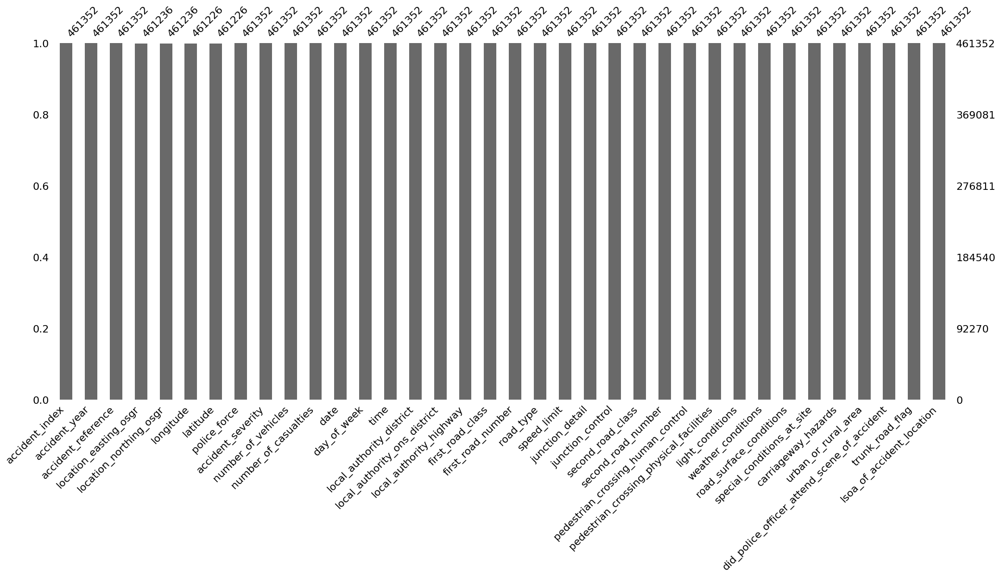

In [20]:
#showing areasof missing information
msno.bar(accident_df)

In [21]:
#checking the null value for accident data
accident_df.isnull().sum()

accident_index                                   0
accident_year                                    0
accident_reference                               0
location_easting_osgr                          116
location_northing_osgr                         116
longitude                                      126
latitude                                       126
police_force                                     0
accident_severity                                0
number_of_vehicles                               0
number_of_casualties                             0
date                                             0
day_of_week                                      0
time                                             0
local_authority_district                         0
local_authority_ons_district                     0
local_authority_highway                          0
first_road_class                                 0
first_road_number                                0
road_type                      

In [22]:
# Dropped rows with missing values because the size is small
accident_df.dropna(subset=['location_northing_osgr', 'location_easting_osgr', 'longitude', 'latitude'], inplace=True)


In [23]:
#checking for null values
accident_df.isnull().sum()


accident_index                                 0
accident_year                                  0
accident_reference                             0
location_easting_osgr                          0
location_northing_osgr                         0
longitude                                      0
latitude                                       0
police_force                                   0
accident_severity                              0
number_of_vehicles                             0
number_of_casualties                           0
date                                           0
day_of_week                                    0
time                                           0
local_authority_district                       0
local_authority_ons_district                   0
local_authority_highway                        0
first_road_class                               0
first_road_number                              0
road_type                                      0
speed_limit         

### CHECKING AND HANDLING -1 IN THE DATA 

In [24]:
#checking for -1 in the data
for col in accident_df.columns:
    count = (accident_df[col] == -1).sum()
    percentage = round(count / len(accident_df) * 100, 3)
    print('Number of -1 in', col, 'is', count, 'Percentage of -1 is', percentage)
    print('------------------------')


Number of -1 in accident_index is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in accident_year is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in accident_reference is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in location_easting_osgr is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in location_northing_osgr is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in longitude is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in latitude is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in police_force is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in accident_severity is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in number_of_vehicles is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in number_of_casualties is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in date is 0 Percentage of -1 is 0

### HANDLING VALUES THAT HAVE -1
 To handle the missing values which is -1 we will be replacing some of them with the mode 

In [25]:
#checking for the unique value
accident_df['speed_limit'].unique()

array([30, 20, 40, 50, 60, 70, -1], dtype=int64)

In [26]:
#finding the mode of the speed limit so as to replace it with the mode
speed_mode = accident_df['speed_limit'].mode()
speed_mode

0    30
Name: speed_limit, dtype: int64

In [27]:
#-1 is replaced with the mode which is 30
#speed limit
accident_df.speed_limit = accident_df.speed_limit.replace([-1],['30']) 
accident_df.speed_limit.value_counts

<bound method IndexOpsMixin.value_counts of 0         30
1         30
2         30
3         30
4         20
          ..
461347    30
461348    30
461349    60
461350    30
461351    30
Name: speed_limit, Length: 461226, dtype: object>

In [28]:
#checking for the unique value
accident_df['junction_detail'].unique()

array([ 0,  3,  1,  6,  2,  9,  7,  5,  8, 99, -1], dtype=int64)

In [29]:
accident_df['road_type'].unique()

array([6, 1, 3, 9, 7, 2], dtype=int64)

In [30]:
#finding the mode of the junction detail so as to replace it with the mode
junction_mode = accident_df['junction_detail'].mode()
junction_mode

0    0
Name: junction_detail, dtype: int64

In [31]:
# Junction_Detail
#-1 is replaced with the mode 0
accident_df.junction_detail = accident_df.junction_detail.replace([-1],['0']) 
accident_df.junction_detail.value_counts

<bound method IndexOpsMixin.value_counts of 0         0
1         3
2         3
3         1
4         6
         ..
461347    1
461348    3
461349    8
461350    3
461351    0
Name: junction_detail, Length: 461226, dtype: object>

In [32]:
#checking the unique values for light conditions
accident_df.light_conditions.unique()

array([ 4,  6,  1,  7,  5, -1], dtype=int64)

In [33]:
#finding the mode for light conditions
light_mode = accident_df['light_conditions'].mode()
light_mode

0    1
Name: light_conditions, dtype: int64

In [34]:
# -1 is replaced with the mode which is 1 (Daylight)
accident_df.light_conditions = accident_df.light_conditions.replace([-1],[1])

accident_df.light_conditions.value_counts

<bound method IndexOpsMixin.value_counts of 0         4
1         4
2         4
3         4
4         4
         ..
461347    1
461348    1
461349    1
461350    1
461351    1
Name: light_conditions, Length: 461226, dtype: int64>

In [35]:
#finding unique value of weather conditions
accident_df.weather_conditions.unique()

array([ 1,  2,  9,  8,  7,  3,  5,  4,  6, -1], dtype=int64)

In [36]:
#finding the mode of weather conditions
weather_mode = accident_df['weather_conditions'].mode()
weather_mode

0    1
Name: weather_conditions, dtype: int64

In [37]:
#-1 is replaced with the mode which is 1
accident_df.weather_conditions = accident_df.weather_conditions.replace([-1],[1])
accident_df.weather_conditions.value_counts

<bound method IndexOpsMixin.value_counts of 0         1
1         1
2         1
3         2
4         1
         ..
461347    1
461348    1
461349    1
461350    1
461351    1
Name: weather_conditions, Length: 461226, dtype: int64>

In [38]:
#finding the unique value of road surface 
accident_df.road_surface_conditions.unique()

array([ 1,  2,  9,  4,  3,  5, -1], dtype=int64)

In [39]:
#finding the mode of road surface conditions
Road_mode = accident_df['road_surface_conditions'].mode()
Road_mode

0    1
Name: road_surface_conditions, dtype: int64

In [40]:
# replacing -1 with the mode which is 1
accident_df.road_surface_conditions = accident_df.road_surface_conditions.replace([-1],[1])
accident_df.road_surface_conditions.value_counts

<bound method IndexOpsMixin.value_counts of 0         1
1         2
2         1
3         2
4         2
         ..
461347    1
461348    1
461349    1
461350    1
461351    1
Name: road_surface_conditions, Length: 461226, dtype: int64>

In [41]:
#finding the unique value of special conditions
accident_df.special_conditions_at_site.unique()

array([ 0,  4,  9,  2,  3,  1,  7,  5,  6, -1], dtype=int64)

In [42]:
#finding the mode of special condition 
condition_mode = accident_df['special_conditions_at_site'].mode()
condition_mode

0    0
Name: special_conditions_at_site, dtype: int64

In [43]:
# replacing -1 with the mode
accident_df.special_conditions_at_site = \
accident_df.special_conditions_at_site.replace([-1],[0])

accident_df.special_conditions_at_site.value_counts

<bound method IndexOpsMixin.value_counts of 0         0
1         0
2         0
3         0
4         0
         ..
461347    0
461348    0
461349    0
461350    0
461351    0
Name: special_conditions_at_site, Length: 461226, dtype: int64>

In [44]:
#finding the unique values of carriageway hazards
accident_df.carriageway_hazards.unique()

array([ 0,  9,  2,  6,  3,  1,  7, -1], dtype=int64)

In [45]:
#finding the mode of carriageway hazards
hazard_mode = accident_df['carriageway_hazards'].mode()
hazard_mode

0    0
Name: carriageway_hazards, dtype: int64

In [46]:
# replacing -1 with the mode 0
accident_df.carriageway_hazards = accident_df.carriageway_hazards.replace([-1],[0])

accident_df.carriageway_hazards.value_counts

<bound method IndexOpsMixin.value_counts of 0         0
1         0
2         0
3         0
4         0
         ..
461347    0
461348    0
461349    0
461350    0
461351    2
Name: carriageway_hazards, Length: 461226, dtype: int64>

In [47]:
#checking unique values of the urban rural area
accident_df.urban_or_rural_area.unique()

array([ 1,  2,  3, -1], dtype=int64)

In [48]:
#finding the mode of the urban rural area
urban_mode = accident_df['urban_or_rural_area'].mode()
urban_mode

0    1
Name: urban_or_rural_area, dtype: int64

In [49]:
# replaced -1 with the mode which is 1
accident_df.urban_or_rural_area = accident_df.urban_or_rural_area.replace([-1],[1])
accident_df.urban_or_rural_area.value_counts

<bound method IndexOpsMixin.value_counts of 0         1
1         1
2         1
3         1
4         1
         ..
461347    1
461348    1
461349    2
461350    1
461351    1
Name: urban_or_rural_area, Length: 461226, dtype: int64>

In [50]:
#due to the high percentage of these variables it would not be nice to impute with another value because it would affect the analysis
accident_df.drop(accident_df[accident_df['pedestrian_crossing_physical_facilities'] == -1].index, inplace = True)
accident_df.drop(accident_df[accident_df['second_road_class'] == -1].index, inplace = True)
accident_df.drop(accident_df[accident_df['pedestrian_crossing_human_control'] == -1].index, inplace = True)
accident_df.drop(accident_df[accident_df['second_road_number'] == -1].index, inplace = True)

In [51]:
df_clean_accident = accident_df

In [52]:
df_clean_accident.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
1,2017010009342,2017,010009342,526790.0,181970.0,-0.173845,51.522425,1,3,2,...,0,4,1,2,0,0,1,1,2,E01004702
2,2017010009344,2017,010009344,535200.0,181260.0,-0.052969,51.514096,1,3,3,...,0,4,1,1,0,0,1,1,2,E01004298
3,2017010009348,2017,010009348,534340.0,193560.0,-0.060658,51.624832,1,3,2,...,4,4,2,2,0,0,1,1,2,E01001429
4,2017010009350,2017,010009350,533680.0,187820.0,-0.072372,51.573408,1,2,1,...,5,4,1,2,0,0,1,1,2,E01001808
6,2017010009353,2017,010009353,508640.0,181870.0,-0.435377,51.525305,1,3,2,...,4,4,1,2,0,0,1,1,2,E01002401


### Clean Casualty Data

In [53]:
#checking for -1 in the data
for col in casualty_df.columns:
    count = (casualty_df[col] == -1).sum()
    percentage = round(count / len(casualty_df) * 100, 3)
    print('Number of -1 in', col, 'is', count, 'Percentage of -1 is', percentage)
    print('------------------------')


Number of -1 in casualty_index is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in accident_index is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in accident_year is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in accident_reference is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in vehicle_reference is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in casualty_reference is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in casualty_class is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in sex_of_casualty is 1542 Percentage of -1 is 0.257
------------------------
Number of -1 in age_of_casualty is 10838 Percentage of -1 is 1.805
------------------------
Number of -1 in age_band_of_casualty is 10838 Percentage of -1 is 1.805
------------------------
Number of -1 in casualty_severity is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in pedestrian_

In [54]:
#checking for null values
casualty_df.isnull().sum()

casualty_index                        0
accident_index                        0
accident_year                         0
accident_reference                    0
vehicle_reference                     0
casualty_reference                    0
casualty_class                        0
sex_of_casualty                       0
age_of_casualty                       0
age_band_of_casualty                  0
casualty_severity                     0
pedestrian_location                   0
pedestrian_movement                   0
car_passenger                         0
bus_or_coach_passenger                0
pedestrian_road_maintenance_worker    0
casualty_type                         0
casualty_home_area_type               0
casualty_imd_decile                   0
dtype: int64

In [55]:
#finding unique value of sex of casuality
casualty_df.sex_of_casualty.unique()

array([ 2,  1, -1,  9], dtype=int64)

In [56]:
#finding the mode of sex of casualty
Surface_mode = casualty_df['sex_of_casualty'].mode()
Surface_mode

0    1
Name: sex_of_casualty, dtype: int64

In [57]:
#-1 is replaced with the mode which is 1
casualty_df.sex_of_casualty = casualty_df.sex_of_casualty.replace([-1],[1]) 
casualty_df.sex_of_casualty.value_counts

<bound method IndexOpsMixin.value_counts of 0         2
1         1
2         1
3         2
4         2
         ..
600327    1
600328    2
600329    1
600330    1
600331    1
Name: sex_of_casualty, Length: 600332, dtype: int64>

In [58]:
#finding the unique value of age of casualty
casualty_df.age_of_casualty.unique()

array([ 18,  19,  33,  31,   3,  45,  14,  58,  27,  39,  48,  26,  47,
        11,  15,  23,  60,  34,  44,  25,  50,  53,  13,  22,  24,  20,
        37,  49,  59,  30,  17,  29,  69,  28,  16,  32,  41,   6,  36,
         4,   7,   5,   8,  21,   9,  76,  73,  43,  54,  52,  74,  84,
        65,  40,  88,  51,  63,  35,  55,  42,  61,  66,  86,  67,  46,
        10,  72,  38,  12,  57,  56,   2,  90,  77,  71,  85,  91,  70,
        62,  87,  80,  83,   0,  64,  89,  79,  82,  68,  -1,  94,   1,
        78,  81,  93,  75,  92,  97,  96,  95,  98, 100,  99, 101, 102],
      dtype=int64)

In [59]:
#finding the mode of age of casualty
age_mode = casualty_df['age_of_casualty'].mode()
age_mode

0    30
Name: age_of_casualty, dtype: int64

In [60]:
#-1 is replaced with the mode which is 30
casualty_df_age_of_casualty = casualty_df.age_of_casualty.replace([-1],[30]) 
casualty_df_age_of_casualty.value_counts

<bound method IndexOpsMixin.value_counts of 0         18
1         19
2         18
3         33
4         31
          ..
600327    11
600328    63
600329    38
600330    76
600331    48
Name: age_of_casualty, Length: 600332, dtype: int64>

In [61]:
#finding the unique value of age band of casualty
casualty_df.age_band_of_casualty.unique()

array([ 4,  6,  1,  7,  3,  9,  8,  5, 10,  2, 11, -1], dtype=int64)

In [62]:
#finding the mode of age band of casualty
age_band_mode = casualty_df['age_band_of_casualty'].mode()
age_band_mode

0    6
Name: age_band_of_casualty, dtype: int64

In [63]:
#-1 is replaced with the mode which is 6
casualty_df.age_band_of_casualty = casualty_df.age_band_of_casualty.replace([-1],[6]) 
casualty_df.age_band_of_casualty.value_counts

<bound method IndexOpsMixin.value_counts of 0          4
1          4
2          4
3          6
4          6
          ..
600327     3
600328     9
600329     7
600330    11
600331     8
Name: age_band_of_casualty, Length: 600332, dtype: int64>

In [64]:
#finding the unique value of the pedestrian location
casualty_df.pedestrian_location.unique()

array([ 0,  4, 10,  6,  1,  5,  8,  9,  7,  2,  3, -1], dtype=int64)

In [65]:
#finding the mode of the pedestrian_location
pedestrian_location_mode = casualty_df['pedestrian_location'].mode()
pedestrian_location_mode

0    0
Name: pedestrian_location, dtype: int64

In [66]:
# Pedestrian_Location
casualty_df.pedestrian_location = casualty_df.pedestrian_location.replace([-1],[0]) 
casualty_df.pedestrian_location.value_counts

<bound method IndexOpsMixin.value_counts of 0          0
1          0
2          0
3          0
4          0
          ..
600327     0
600328    10
600329     0
600330     0
600331     9
Name: pedestrian_location, Length: 600332, dtype: int64>

In [67]:
#finding the unique value of the car passengeer
casualty_df.car_passenger.unique()

array([ 1,  0,  2,  9, -1], dtype=int64)

In [68]:
#finding the mode of the car passenger
car_passenger_mode = casualty_df['car_passenger'].mode()
car_passenger_mode

0    0
Name: car_passenger, dtype: int64

In [69]:
# Car_Passenger
casualty_df.car_passenger = casualty_df.car_passenger.replace([-1],[0]) 
casualty_df.car_passenger.value_counts

<bound method IndexOpsMixin.value_counts of 0         1
1         0
2         0
3         1
4         0
         ..
600327    0
600328    0
600329    0
600330    0
600331    0
Name: car_passenger, Length: 600332, dtype: int64>

In [70]:
#finding the unique value of coach passenger
casualty_df.bus_or_coach_passenger.unique()

array([ 0,  3,  4,  1,  2, -1,  9], dtype=int64)

In [71]:
#finding the mode of coach passenger
bus_or_coach_passenger_mode = casualty_df['bus_or_coach_passenger'].mode()
bus_or_coach_passenger_mode

0    0
Name: bus_or_coach_passenger, dtype: int64

In [72]:
#Bus_or_Coach_Passenger
casualty_df.bus_or_coach_passenger = casualty_df.bus_or_coach_passenger.replace([-1],[0]) 
casualty_df.bus_or_coach_passenger.value_counts

<bound method IndexOpsMixin.value_counts of 0         0
1         0
2         0
3         0
4         0
         ..
600327    0
600328    0
600329    0
600330    0
600331    0
Name: bus_or_coach_passenger, Length: 600332, dtype: int64>

In [73]:
#finding the unique value of pedestrian road maintenance
casualty_df.pedestrian_road_maintenance_worker.unique()

array([ 0,  2,  3,  1, -1], dtype=int64)

In [74]:
#finding the mode of the pedestrian road maintenance
pedestrian_road_maintenance_worker_mode = casualty_df['pedestrian_road_maintenance_worker'].mode()
pedestrian_road_maintenance_worker_mode

0    0
Name: pedestrian_road_maintenance_worker, dtype: int64

In [75]:
#Pedestrian_Road_Maintenance_Worker
#replacing -1 with the mode which is 0
casualty_df.pedestrian_road_maintenance_worker = casualty_df.pedestrian_road_maintenance_worker.replace([-1],[0]) 
casualty_df.pedestrian_road_maintenance_worker.value_counts

<bound method IndexOpsMixin.value_counts of 0         0
1         0
2         0
3         0
4         0
         ..
600327    0
600328    0
600329    0
600330    0
600331    0
Name: pedestrian_road_maintenance_worker, Length: 600332, dtype: int64>

In [76]:
#finding unique value of casualty type
casualty_df.casualty_type.unique()

array([ 9,  2,  0,  3,  8,  1, 11,  4, 90, 19,  5, 10, 21, 20, 16, 98, 23,
       22, 17, 97, 18, 99, -1], dtype=int64)

In [77]:
#finding the mode for the casualty type 
casualty_type_mode = casualty_df['casualty_type'].mode()
casualty_type_mode

0    9
Name: casualty_type, dtype: int64

In [78]:
#Casualty_Type
#replacing -1 with the mode which is 9
casualty_df.casualty_type = casualty_df.casualty_type.replace([-1],[9]) 
casualty_df.casualty_type.value_counts

<bound method IndexOpsMixin.value_counts of 0         9
1         2
2         2
3         9
4         9
         ..
600327    1
600328    0
600329    5
600330    1
600331    0
Name: casualty_type, Length: 600332, dtype: int64>

In [79]:
casualty_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 600332 entries, 0 to 600331
Data columns (total 19 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   casualty_index                      600332 non-null  int64 
 1   accident_index                      600332 non-null  object
 2   accident_year                       600332 non-null  int64 
 3   accident_reference                  600332 non-null  object
 4   vehicle_reference                   600332 non-null  int64 
 5   casualty_reference                  600332 non-null  int64 
 6   casualty_class                      600332 non-null  int64 
 7   sex_of_casualty                     600332 non-null  int64 
 8   age_of_casualty                     600332 non-null  int64 
 9   age_band_of_casualty                600332 non-null  int64 
 10  casualty_severity                   600332 non-null  int64 
 11  pedestrian_location                 600

In [80]:
#casualty home area type and casualty imd decile have high percentage of -1 so we need to drop this because imputing with mode would affect the analysis
casualty_df.drop(casualty_df[casualty_df['casualty_imd_decile'] == -1].index, inplace = True)
casualty_df.drop(casualty_df[casualty_df['casualty_home_area_type'] == -1].index, inplace = True)



### CLEANING VEHICLE DATA

In [81]:
vehicle_df.isnull().sum()

vehicle_index                       0
accident_index                      0
accident_year                       0
accident_reference                  0
vehicle_reference                   0
vehicle_type                        0
towing_and_articulation             0
vehicle_manoeuvre                   0
vehicle_direction_from              0
vehicle_direction_to                0
vehicle_location_restricted_lane    0
junction_location                   0
skidding_and_overturning            0
hit_object_in_carriageway           0
vehicle_leaving_carriageway         0
hit_object_off_carriageway          0
first_point_of_impact               0
vehicle_left_hand_drive             0
journey_purpose_of_driver           0
sex_of_driver                       0
age_of_driver                       0
age_band_of_driver                  0
engine_capacity_cc                  0
propulsion_code                     0
age_of_vehicle                      0
generic_make_model                  0
driver_imd_d

In [82]:
#checking for -1 in the data
for col in vehicle_df.columns:
    count = (vehicle_df[col] == -1).sum()
    percentage = round(count / len(casualty_df) * 100, 3)
    print('Number of -1 in', col, 'is', count, 'Percentage of -1 is', percentage)
    print('------------------------')


Number of -1 in vehicle_index is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in accident_index is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in accident_year is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in accident_reference is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in vehicle_reference is 0 Percentage of -1 is 0.0
------------------------
Number of -1 in vehicle_type is 791 Percentage of -1 is 0.151
------------------------
Number of -1 in towing_and_articulation is 2553 Percentage of -1 is 0.489
------------------------
Number of -1 in vehicle_manoeuvre is 1828 Percentage of -1 is 0.35
------------------------
Number of -1 in vehicle_direction_from is 6251 Percentage of -1 is 1.196
------------------------
Number of -1 in vehicle_direction_to is 7547 Percentage of -1 is 1.444
------------------------
Number of -1 in vehicle_location_restricted_lane is 1915 Percentage of -1 is 0.366
---------------

In [83]:
#finding the unique of towing and articulation
vehicle_df.towing_and_articulation.unique()

array([ 0,  1,  4,  5,  9,  3,  2, -1], dtype=int64)

In [84]:
#finding the mode of towing and articulation
towing_and_articulation_mode = vehicle_df['towing_and_articulation'].mode()
towing_and_articulation_mode

0    0
Name: towing_and_articulation, dtype: int64

In [85]:
#Towing_and_Articulation
#Add missing data(-1) to mode (No tow/articulation)
vehicle_df.towing_and_articulation = vehicle_df.towing_and_articulation.replace([-1],[0]) 
vehicle_df.towing_and_articulation.value_counts

<bound method IndexOpsMixin.value_counts of 0         0
1         0
2         0
3         0
4         0
         ..
849086    0
849087    0
849088    0
849089    0
849090    0
Name: towing_and_articulation, Length: 849091, dtype: int64>

In [86]:
#finding unique value of journey purpose of driver
vehicle_df.journey_purpose_of_driver.unique()

array([ 6,  1,  2,  3,  4,  5, -1], dtype=int64)

In [87]:
#finding the unique value of journey purpose of driver
journey_purpose_of_driver_mode = vehicle_df['journey_purpose_of_driver'].mode()
journey_purpose_of_driver_mode

0    6
Name: journey_purpose_of_driver, dtype: int64

In [88]:
#Journey_Purpose_of_Driver
#replacing -1 with the mode which is 6
vehicle_df.journey_purpose_of_driver = vehicle_df.journey_purpose_of_driver.replace([-1],[6]) 
vehicle_df.journey_purpose_of_driver.value_counts

<bound method IndexOpsMixin.value_counts of 0         6
1         6
2         6
3         6
4         6
         ..
849086    1
849087    5
849088    6
849089    6
849090    6
Name: journey_purpose_of_driver, Length: 849091, dtype: int64>

In [89]:
#Due to the high percentage of -1 in the vehicle dataset
#we would drop the dataset instead of imputing with the mode so as to not affect the analysis
vehicle_df.drop(vehicle_df[vehicle_df['age_of_driver'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['age_band_of_driver'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['engine_capacity_cc'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['propulsion_code'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['age_of_vehicle'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['driver_imd_decile'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['driver_home_area_type'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['first_point_of_impact'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['skidding_and_overturning'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['hit_object_in_carriageway'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['vehicle_leaving_carriageway'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['hit_object_off_carriageway'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['vehicle_manoeuvre'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['vehicle_location_restricted_lane'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['junction_location'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['first_point_of_impact'] == -1].index, inplace = True)
vehicle_df.drop(vehicle_df[vehicle_df['vehicle_left_hand_drive'] == -1].index, inplace = True)

### DEALING WITH TIME AND DATE

In [90]:
#Extracting the hour part (characters at index 0 and 1) from the 'Time' column
accident_df['Hour']= accident_df['time'].str[0:2]

In [91]:
#Extracting the hour part (characters at index 0 and 1) from the 'Time' column
accident_df['Hour']= accident_df['time'].str[0:2]
#Extracting the months (characters at index 3 and 4) from date colunms
accident_df['Months'] = accident_df['date'].str[3:5]

In [92]:
#converting days of week to word from numbers
#Defining lists for weekdays and weekends.
weekday = [2,3,4,5,6]
weekend = [1,7]
#Using the 'map' function along with a lambda function to create a new 'weekdays' column.
accident_df['weekdays']= accident_df['day_of_week'].map(lambda x: 'weekday' if x in weekday else 'weekend')

In [93]:
#changing the datatype
accident_df['latitude'] = accident_df['latitude'].astype(float)
accident_df['date']= accident_df['date'].astype('datetime64')
accident_df['longitude'] = accident_df['longitude'].astype(float)


C:\Users\HP\AppData\Local\Temp\ipykernel_7396\2798988477.py:3: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  accident_df['date']= accident_df['date'].astype('datetime64')


### QUESTION 1: Are there significant hours of the day, and days of the week, on which accident occur?

### HOUR OF THE DAY ON WHICH ACCIDENT OCCUR

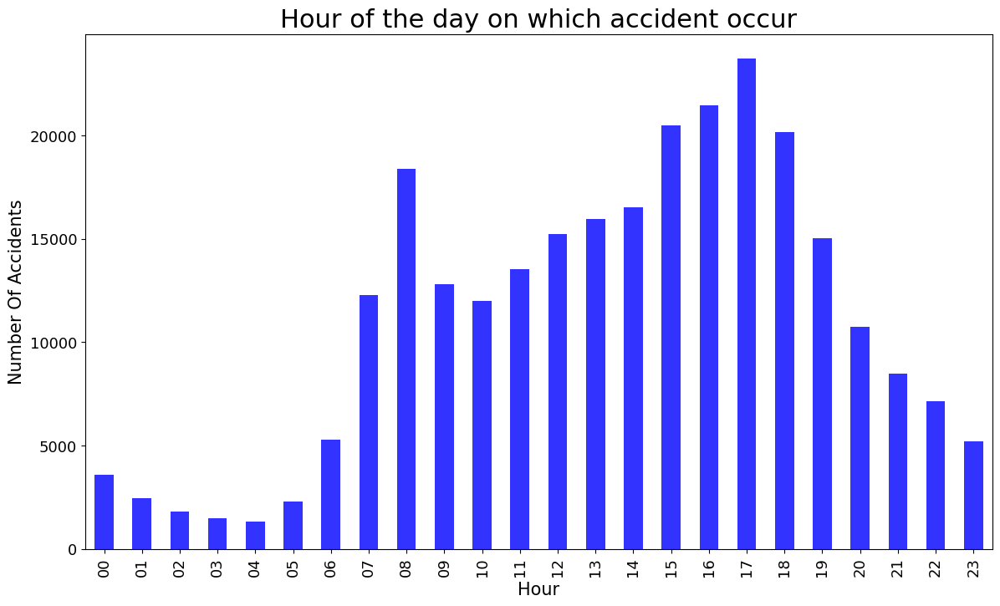

In [94]:
#import libraries
import matplotlib.pyplot as plt

#Grouping the data by 'Hour' and counting the occurrences of each hour
accident_df_by_hour = accident_df['Hour'].groupby(accident_df['Hour']).count()

#Create a new figure and axis for the plot
fig, ax = plt.subplots(figsize=(14, 8))
accident_df_by_hour.plot(kind='bar', color='blue', alpha=0.8, fontsize=13)

# Setting the title and label of the plot
ax.set_title('Hour of the day on which accident occur', fontsize=22)
ax.set_xlabel('Hour', fontsize=15)
ax.set_ylabel('Number Of Accidents', fontsize=15)

# Display plot
plt.show()


### DAYS OF THE WEEK ON WHICH ACCIDENT OCCUR

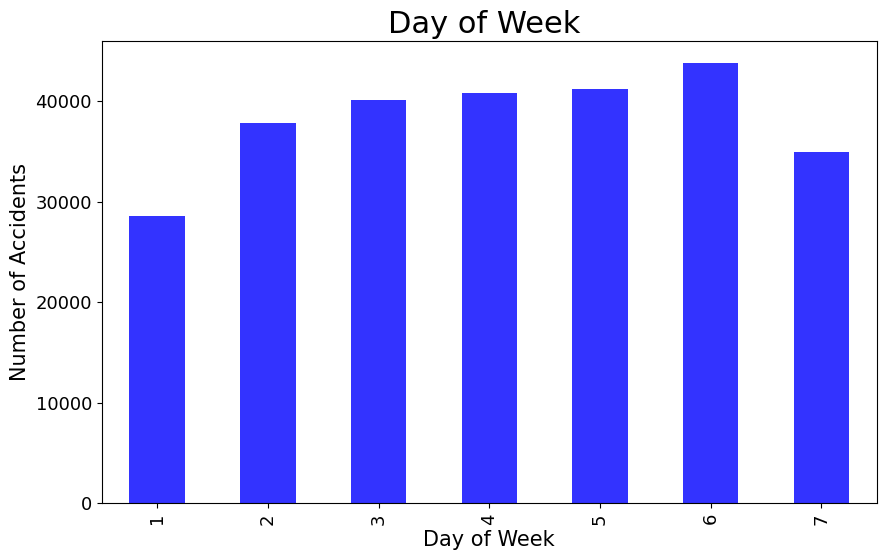

In [95]:
#import libraries
import matplotlib.pyplot as plt

# Grouping the data by 'day_of_week'
accident_df_by_day_week = accident_df['day_of_week'].groupby(accident_df['day_of_week']).count()

# Create a new figure and axis for the plot
fig, ax = plt.subplots(figsize=(10, 6))
accident_df_by_day_week.plot(kind='bar', color='blue', alpha=0.8, fontsize=13)

# Setting the title and label of the plot
ax.set_title('Day of Week ', fontsize=22)
ax.set_xlabel('Day of Week', fontsize=15)
ax.set_ylabel('Number of Accidents', fontsize=15)

#Display plot
plt.show()


### File merging

In [96]:
#Using the pd.merge function to perform an inner join on the 'accident_index' column.
accident_df = pd.merge(accident_df,vehicle_df, how = 'inner', on = 'accident_index')

In [97]:
#Using the pd.merge function to perform an inner join on the 'accident_index' column.
accident_df = pd.merge(accident_df ,casualty_df , how = 'inner', on = 'accident_index')

### QUESTION 2: FOR MOTOBIKES , ARE THERE SIGNIFICANT HOURS OF THE DAY, AND DAYS OF THE WEEK, ON WHICH ACCIDENTS OCCUR

In [98]:
#the vehicle type has numeric labels whhich include 2, 3, 4,5
#since our focus is on Motorcycle 125cc and under, motorcycle over 125cc and up to 500cc, and motorcycle over 500cc
#which represents label 2,3,4,5
motorbikes = accident_df[accident_df['vehicle_type'].isin([2,3,4,5])]

In [99]:
#Get the count of occurrences of each unique hour value in the 'Hour' column.
motorbikes['Hour'].value_counts()

17    3832
16    3219
18    3091
15    2756
19    2410
14    2334
13    2259
08    2066
12    2049
07    1861
20    1815
11    1698
21    1456
09    1346
10    1334
22    1079
06     808
23     712
00     361
05     258
01     218
02     122
04      90
03      86
Name: Hour, dtype: int64

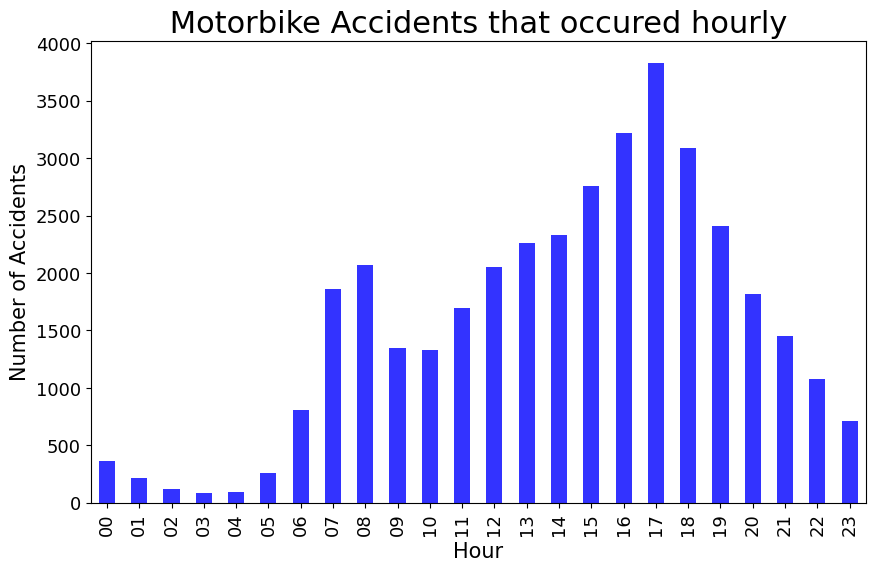

In [100]:
# Hour of the day
import matplotlib.pyplot as plt
#Get the count of occurrences of each unique hour value in the 'Hour' column
motorbike_by_hour = motorbikes['Hour'].value_counts().sort_index()

#Create a new figure and axis for the plot.
ax = motorbike_by_hour.plot(kind='bar', figsize=(10, 6), color='blue', alpha=0.8, fontsize=13)

#Set the title and axis labels.
ax.set_title(' Motorbike Accidents that occured hourly ', fontsize=22)
ax.set_xlabel('Hour', fontsize=15)
ax.set_ylabel('Number of Accidents', fontsize=15)

#display plot
plt.show()


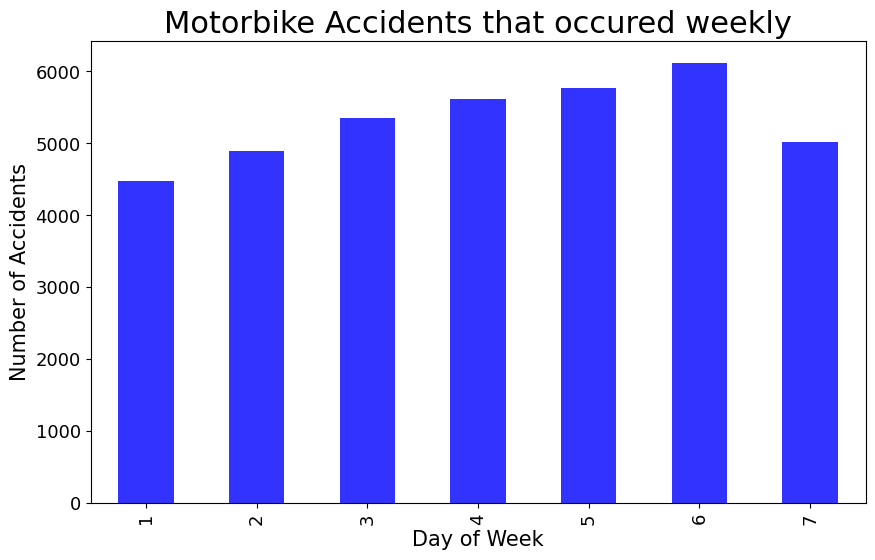

In [101]:
## Days of the week with motobikes 
import matplotlib.pyplot as plt

#Get the count of occurrences of each unique day_of_week value 
motorbikes_accidents_by_week = motorbikes['day_of_week'].value_counts().sort_index()

#Create a new figure and axis for the plot.
ax = motorbikes_accidents_by_week.plot(kind='bar', figsize=(10, 6), color='blue', alpha=0.8, fontsize=13)

#Set the title and axis labels.
ax.set_title('Motorbike Accidents that occured weekly', fontsize=22)
ax.set_xlabel('Day of Week', fontsize=15)
ax.set_ylabel('Number of Accidents', fontsize=15)

#Display the plot.
plt.show()

### QUESTION 3: FOR PEDESTRIANS INVOLVED IN ACCIDENTS, ARE THERE SIGNIFICANT HOURS OF THE DAY, AND DAYS OF THE WEEK, ON WHICH THEY ARE MORE LIKELY TO BE INVOLVED?

In [102]:
#the casualty class is in numeric form which include 1,2,3
#1- represents Driver /Rider
#2- represents Veh./pillion Passenger
#3- represents Pedestrian
accident_df['casualty_class'].value_counts()

1    287686
2     88294
3     25003
Name: casualty_class, dtype: int64

In [103]:
#since our focus is on the pedestrians involved in accidents so our casualty class is 3
pedestrian_accidents = accident_df[accident_df['casualty_class']==3]
len(pedestrian_accidents)

25003

In [104]:
#Get the count of occurrences of each unique hour value in the 'Hour' column.
pedestrian_accidents['Hour'].value_counts()

15    2707
16    2232
17    2225
18    1945
08    1926
14    1491
12    1446
13    1426
19    1408
11    1205
10    1126
09    1112
07     878
20     861
22     705
21     650
23     430
00     317
06     280
01     217
02     151
03     106
05      91
04      68
Name: Hour, dtype: int64

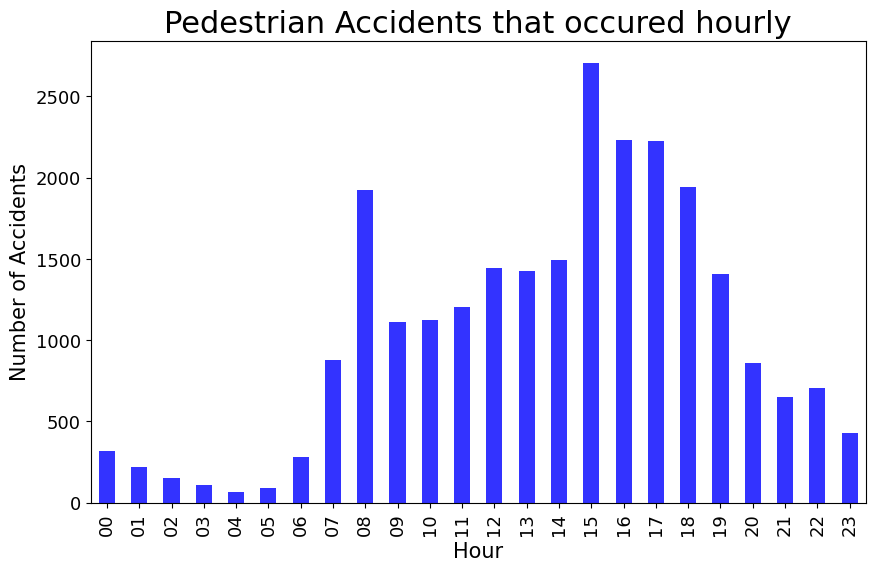

In [105]:
import matplotlib.pyplot as plt

#Get the count of occurrences of each unique hour value
pedestrian_by_hour = pedestrian_accidents['Hour'].value_counts().sort_index()

#Create a new figure and axis for the plot.
ax = pedestrian_by_hour.plot(kind='bar', figsize=(10, 6), color='blue', alpha=0.8, fontsize=13)

#Set the title and axis labels.
ax.set_title('Pedestrian Accidents that occured hourly', fontsize=22)
ax.set_xlabel('Hour', fontsize=15)
ax.set_ylabel('Number of Accidents', fontsize=15)

#Display plot
plt.show()

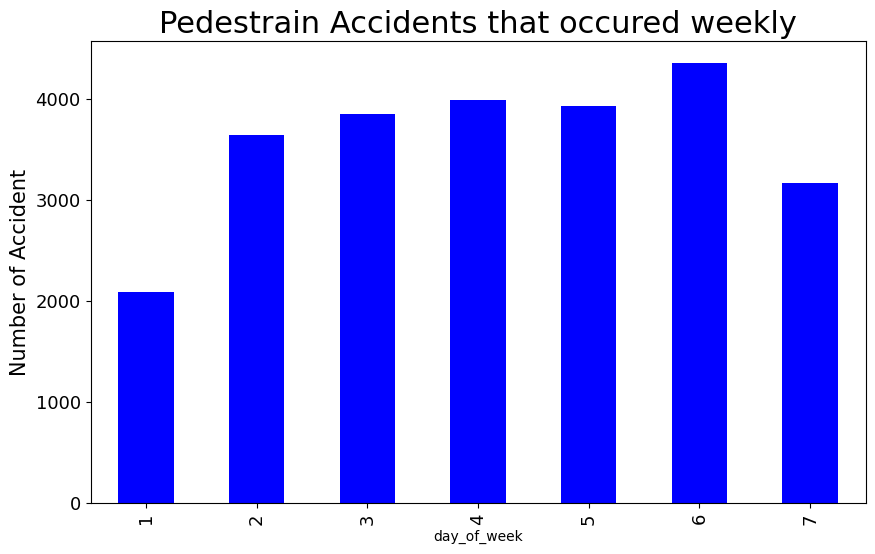

In [146]:
#Group the data by the 'day_of_week' category and calculate the count of pedestrian accidents for each day.
pedestrian_by_day = pedestrian_accidents['day_of_week'].groupby(pedestrian_accidents['day_of_week']).count()

#Creating a new figure and axis for the plot.
ax = pedestrian_by_day.plot(kind = 'bar', figsize = (10,6),color = 'blue',fontsize =13);

#Setting the transparency of the bars to 0.8.
ax.set_alpha(0.8)

#Setting the title and axis labels
ax.set_title('Pedestrain Accidents that occured weekly', fontsize= 22)
ax.set_ylabel('Number of Accident', fontsize = 15)

#Display plot
plt.show()

In [107]:
df_clean_accident.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,Hour,Months,weekdays
1,2017010009342,2017,010009342,526790.0,181970.0,-0.173845,51.522425,1,3,2,...,2,0,0,1,1,2,E01004702,01,01,weekend
2,2017010009344,2017,010009344,535200.0,181260.0,-0.052969,51.514096,1,3,3,...,1,0,0,1,1,2,E01004298,00,01,weekend
3,2017010009348,2017,010009348,534340.0,193560.0,-0.060658,51.624832,1,3,2,...,2,0,0,1,1,2,E01001429,01,01,weekend
4,2017010009350,2017,010009350,533680.0,187820.0,-0.072372,51.573408,1,2,1,...,2,0,0,1,1,2,E01001808,01,01,weekend
6,2017010009353,2017,010009353,508640.0,181870.0,-0.435377,51.525305,1,3,2,...,2,0,0,1,1,2,E01002401,04,01,weekend


In [108]:
df_clean_accident.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 267237 entries, 1 to 461350
Data columns (total 39 columns):
 #   Column                                       Non-Null Count   Dtype         
---  ------                                       --------------   -----         
 0   accident_index                               267237 non-null  object        
 1   accident_year                                267237 non-null  int64         
 2   accident_reference                           267237 non-null  object        
 3   location_easting_osgr                        267237 non-null  float64       
 4   location_northing_osgr                       267237 non-null  float64       
 5   longitude                                    267237 non-null  float64       
 6   latitude                                     267237 non-null  float64       
 7   police_force                                 267237 non-null  int64         
 8   accident_severity                            267237 non-null  in

### QUESTION 4: USING APRIORI ALGORITHM, EXPLORE THE IMPACT OF SELECTED VARIABLES ON ACCIDENT SEVERITY

In [109]:
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

In [110]:
import pandas as pd

# One-hot encode the 'accident_severity' column
severity_encoded = pd.get_dummies(df_clean_accident['accident_severity'], prefix='severity')

# One-hot encode the 'speed_limit' column
speed_encoded = pd.get_dummies(df_clean_accident['speed_limit'], prefix='speed')

# One-hot encode the 'speed_limit' column
weather_encoded = pd.get_dummies(df_clean_accident['weather_conditions'], prefix='weather_conditions')

# Concatenate the one-hot encoded columns with the DataFrame
df_encoded = pd.concat([ severity_encoded, speed_encoded, weather_encoded], axis=1)



In [111]:
df_encoded

,severity_1,severity_2,severity_3,speed_20,speed_30,speed_40,speed_50,speed_60,speed_70,speed_30,weather_conditions_1,weather_conditions_2,weather_conditions_3,weather_conditions_4,weather_conditions_5,weather_conditions_6,weather_conditions_7,weather_conditions_8,weather_conditions_9
1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
6,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461345,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
461347,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
461348,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0
461349,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0


In [112]:
from mlxtend.frequent_patterns import apriori, association_rules


# frequent itemsets using apriori algorithm
frequent_itemsets = apriori(df_encoded, min_support=0.2, use_colnames=True)

# Generate association rules from frequent itemsets
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1.0)




C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


In [113]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(speed_30),(severity_3),0.672691,0.817349,0.554515,0.824324,1.008533,0.004691,1.039699,0.025849
1,(severity_3),(speed_30),0.817349,0.672691,0.554515,0.678431,1.008533,0.004691,1.017850,0.046321
2,"(speed_30, weather_conditions_1)",(severity_3),0.535783,0.817349,0.439569,0.820423,1.003761,0.001647,1.017116,0.008071
3,"(weather_conditions_1, severity_3)",(speed_30),0.648870,0.672691,0.439569,0.677437,1.007055,0.003080,1.014714,0.019953
4,(speed_30),"(weather_conditions_1, severity_3)",0.672691,0.648870,0.439569,0.653448,1.007055,0.003080,1.013210,0.021405
5,(severity_3),"(speed_30, weather_conditions_1)",0.817349,0.535783,0.439569,0.537798,1.003761,0.001647,1.004359,0.020512


In [114]:
rules["antecedent_len"] = rules["antecedents"].apply(lambda x: len(x))
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,antecedent_len
0,(speed_30),(severity_3),0.672691,0.817349,0.554515,0.824324,1.008533,0.004691,1.039699,0.025849,1
1,(severity_3),(speed_30),0.817349,0.672691,0.554515,0.678431,1.008533,0.004691,1.017850,0.046321,1
2,"(speed_30, weather_conditions_1)",(severity_3),0.535783,0.817349,0.439569,0.820423,1.003761,0.001647,1.017116,0.008071,2
3,"(weather_conditions_1, severity_3)",(speed_30),0.648870,0.672691,0.439569,0.677437,1.007055,0.003080,1.014714,0.019953,2
4,(speed_30),"(weather_conditions_1, severity_3)",0.672691,0.648870,0.439569,0.653448,1.007055,0.003080,1.013210,0.021405,1
5,(severity_3),"(speed_30, weather_conditions_1)",0.817349,0.535783,0.439569,0.537798,1.003761,0.001647,1.004359,0.020512,1


In [115]:
rules[ (rules['antecedent_len'] >= 2) ]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,antecedent_len
2,"(speed_30, weather_conditions_1)",(severity_3),0.535783,0.817349,0.439569,0.820423,1.003761,0.001647,1.017116,0.008071,2
3,"(weather_conditions_1, severity_3)",(speed_30),0.648870,0.672691,0.439569,0.677437,1.007055,0.003080,1.014714,0.019953,2


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,antecedent_len
2,"(speed_30, weather_conditions_1)",(severity_3),0.535783,0.817349,0.439569,0.820423,1.003761,0.001647,1.017116,0.008071,2
3,"(weather_conditions_1, severity_3)",(speed_30),0.648870,0.672691,0.439569,0.677437,1.007055,0.003080,1.014714,0.019953,2


### QUESTION 5: Identify accidents in our region: Kingston upon Hull,Humberside, and the east riding of yorkshire etc. You can do this by filtering on LSOA, or police region or another method if you can find one. Run clustering on this data.What do these clusters reveal about the distribution of accidents in our region? 

In [116]:
# Fetch all LSOA records for Kingston Upon Hull
cur.execute("select * from lsoa where lsoa01nm like '%kingston upon hull%' ").fetchall()

[(12756,
  'E01012756',
  'Kingston upon Hull 025A',
  'Kingston upon Hull 025A',
  198940.919128418,
  3498.35589523394,
  '6f44ac4a-9449-4c64-8564-6f612bf9a060'),
 (12757,
  'E01012757',
  'Kingston upon Hull 025B',
  'Kingston upon Hull 025B',
  318087.393493652,
  3716.58751696017,
  'e1c0a075-7ca8-425e-8437-39db56a6b994'),
 (12758,
  'E01012758',
  'Kingston upon Hull 018A',
  'Kingston upon Hull 018A',
  311920.258041382,
  3775.30382264056,
  'a049347f-f7fb-481f-90ca-a95e632ac97a'),
 (12759,
  'E01012759',
  'Kingston upon Hull 025C',
  'Kingston upon Hull 025C',
  398188.211227417,
  3984.80788034756,
  'f55da506-35c7-4db5-a007-bba4255d50e3'),
 (12760,
  'E01012760',
  'Kingston upon Hull 025D',
  'Kingston upon Hull 025D',
  125999.228485107,
  2082.91530548868,
  'dc1e40d1-79fe-4cda-b204-d22f9362b043'),
 (12761,
  'E01012761',
  'Kingston upon Hull 015A',
  'Kingston upon Hull 015A',
  278866.730682373,
  3111.34362421667,
  '16913aa9-ffc0-4a89-9e0c-a0be44f7a3e6'),
 (12762,
 

In [117]:
#Define the column names for the resulting data frame
column_records = ["accident_severity","longitude","latitude","location_easting_osgr","location_northing_osgr"]

In [118]:
#SQL query to retrieve the desired data

query = '''
    SELECT accident_severity,longitude,latitude,location_easting_osgr,location_northing_osgr
    FROM accident
    JOIN casualty ON accident.accident_index = casualty.accident_index
    JOIN vehicle ON accident.accident_index = vehicle.accident_index
    JOIN lsoa ON lsoa.lsoa01cd = accident.lsoa_of_accident_location
    WHERE lsoa01nm LIKE '%kingston upon hull%'
'''

In [119]:
#Execute the SQL query
cur.execute(query)
result = cur.fetchall()

In [120]:
#Create a Pandas DataFrame From the query results
hull_accidents_df = pd.DataFrame(result, columns=column_records)
hull_accidents_df

,accident_severity,longitude,latitude,location_easting_osgr,location_northing_osgr
0,3,-0.393435,53.745044,506049.0,428825.0
1,3,-0.393435,53.745044,506049.0,428825.0
2,3,-0.354873,53.743082,508597.0,428665.0
3,3,-0.354873,53.743082,508597.0,428665.0
4,3,-0.354873,53.743082,508597.0,428665.0
...,...,...,...,...,...
6382,3,-0.343885,53.781494,509222.0,432955.0
6383,3,-0.343885,53.781494,509222.0,432955.0
6384,3,-0.308880,53.782750,511525.0,433149.0
6385,3,-0.342063,53.742609,509443.0,428632.0


In [121]:
hull_accidents_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6387 entries, 0 to 6386
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   accident_severity       6387 non-null   int64  
 1   longitude               6387 non-null   float64
 2   latitude                6387 non-null   float64
 3   location_easting_osgr   6387 non-null   float64
 4   location_northing_osgr  6387 non-null   float64
dtypes: float64(4), int64(1)
memory usage: 249.6 KB


In [122]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import warnings


# extracting the relevant features needed for clustering
features_for_clustering = hull_accidents_df[['latitude', 'longitude']]

# Performing standardization on the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features_for_clustering)

# Applying k-means clustering
num_clusters = 3

# Creating the k-means model 
# Suppressing the warning
with warnings.catch_warnings(): 
    warnings.filterwarnings("ignore", category=FutureWarning)
    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)
# Fitting the model to the scaled features
kmeans.fit(scaled_features)
# Adding the cluster labels to the DataFrame
hull_accidents_df['Cluster'] = kmeans.labels_


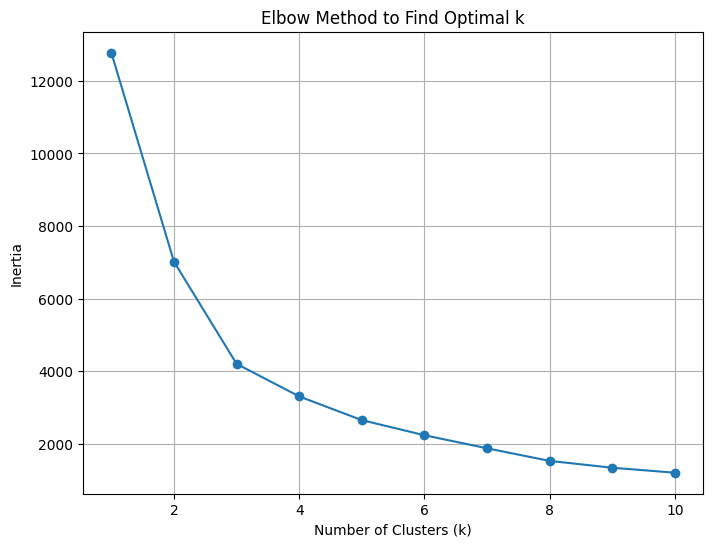

In [123]:
import matplotlib.pyplot as plt
inertia_values = []
k_values = range(1, 11)  
for k in k_values:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(scaled_features)
    inertia_values.append(kmeans.inertia_)
# Plotting the inertia values against the number of clusters
plt.figure(figsize=(8, 6))
plt.plot(k_values, inertia_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method to Find Optimal k')
plt.grid(True)
plt.show()


In [124]:
# extracting the relevant features needed for clustering
features_for_clustering = hull_accidents_df[['latitude', 'longitude']]

# Performing standardization on the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features_for_clustering)

# Applying k-means clustering
num_clusters = 3

# Creating the k-means model and explicitly set n_init value
with warnings.catch_warnings():  # Suppress the warning
    warnings.filterwarnings("ignore", category=FutureWarning)
    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=42)

# Fitting the model to the scaled features
kmeans.fit(scaled_features)

# Adding the cluster labels to the DataFrame
hull_accidents_df['Cluster'] = kmeans.labels_


print(hull_accidents_df['Cluster'])


0       2
1       2
2       2
3       2
4       2
       ..
6382    0
6383    0
6384    0
6385    2
6386    2
Name: Cluster, Length: 6387, dtype: int32


In [125]:
import folium

# Creating a map centered on Hull
map_hull = folium.Map(location=[hull_accidents_df['latitude'].mean(), hull_accidents_df['longitude'].mean()], zoom_start=12)

# Defining colors for each cluster
cluster_colors = {0: 'grey', 1: 'white', 2: 'pink'} 

# Defining colors for each accident severity
severity_colors = {1: 'red', 2: 'green', 3: 'blue'}  

# Plotting each accident on the map with its respective cluster color and accident severity color
for _, row in hull_accidents_df.iterrows():
    cluster_color = cluster_colors[row['Cluster']]
    severity_color = severity_colors[row['accident_severity']]
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=cluster_color,
        fill=True,
        # Using the accident severity color as the fill color
        fill_color=severity_color  
    ).add_to(map_hull)

# Display the map
map_hull


In [126]:
import folium

# Creating a map centered on Hull
map_hull = folium.Map(location=[hull_accidents_df['latitude'].mean(), hull_accidents_df['longitude'].mean()], zoom_start=12)

# Defining colors for each cluster
cluster_colors = {0: 'grey', 1: 'white', 2: 'pink'} 

# Defining colors for each accident severity
severity_colors = {1: 'red', 2: 'green', 3: 'blue'}  

# Plotting each accident on the map with its respective cluster color and accident severity color
for _, row in hull_accidents_df.iterrows():
    cluster_color = cluster_colors[row['Cluster']]
    severity_color = severity_colors[row['accident_severity']]
    
    # I Created a pop-up HTML content to show the location, cluster and accident severity
    popup_content = f"Location: {row['latitude']}, {row['longitude']}<br>" \
                    f"Cluster: {row['Cluster']}<br>" \
                    f"Severity: {row['accident_severity']}"
    
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=cluster_color,
        fill=True,
        fill_color=severity_color,
        popup=folium.Popup(html=popup_content, parse_html=True)
    ).add_to(map_hull)

# Display the map
map_hull

### QUESTION 6: Using outlier detection methods, identify unusual entries in your data set. Should you keep these entries in your data?

In [127]:
df_Outlier = df_clean_accident.drop(columns=[
    'accident_index',
    'special_conditions_at_site',
    'carriageway_hazards',
    'junction_detail',
    'lsoa_of_accident_location',
    'location_easting_osgr',
    'location_northing_osgr',
    'second_road_class',
    'second_road_number',
    'first_road_number',
    'first_road_class'
])

In [128]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest

# Selecting features for outlier detection (latitude and longitude directly from the DataFrame)
features_for_outliers = ['latitude', 'longitude']
X_outliers = df_Outlier[features_for_outliers]

# Standardizing the features
scaler = StandardScaler()
X_outliers_scaled = scaler.fit_transform(X_outliers)

# Applying Isolation Forest for outlier detection
isolation_forest = IsolationForest(contamination=0.01, random_state=42)
outliers_mask = isolation_forest.fit_predict(X_outliers_scaled)

# Adding the outliers_mask as a new column to the dataset
df_Outlier['Is_Outlier'] = outliers_mask

In [129]:
# Filter the DataFrame to get only the outliers
# -1 represents outliers from Isolation Forest
outliers_df = df_Outlier[df_Outlier['Is_Outlier'] == -1]
# Print the outliers
print(outliers_df)


        accident_year accident_reference  longitude   latitude  police_force  \
108261           2017          500145802  -4.704329  50.581386            50   
108266           2017          500146210  -4.751945  50.566967            50   
108268           2017          500146233  -5.400810  50.196683            50   
108282           2017          500147174  -4.694134  50.458868            50   
108290           2017          500147718  -5.095646  50.265738            50   
...               ...                ...        ...        ...           ...   
461299           2020          991011625  -4.045778  57.802349            99   
461310           2020          991012356  -6.263299  57.451282            99   
461314           2020          991012610  -3.533043  58.592504            99   
461326           2020          991014080  -2.411295  56.871085            99   
461349           2020          991030297  -2.271903  57.186317            99   

        accident_severity  number_of_ve

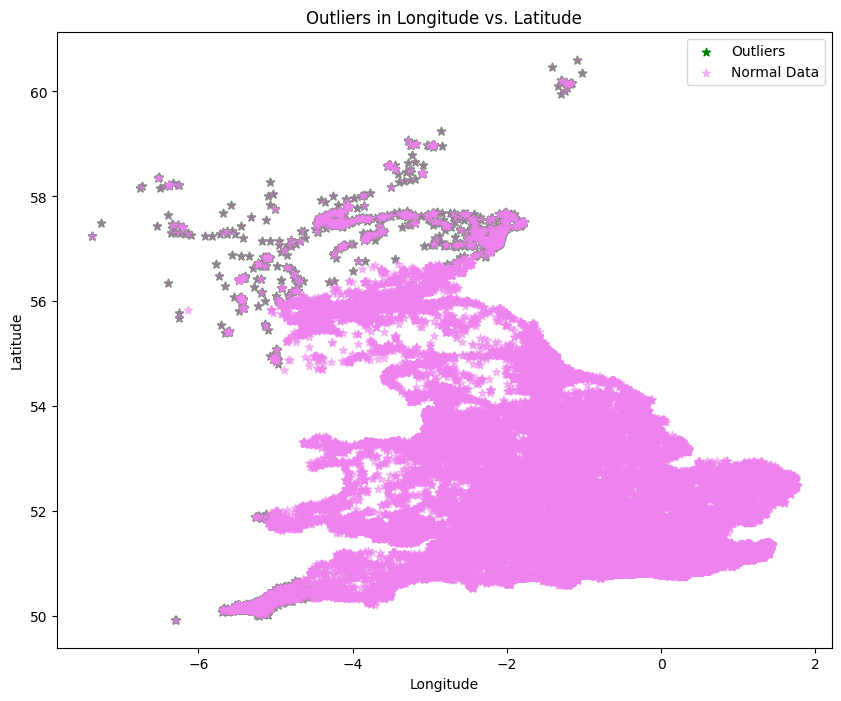

In [130]:
import matplotlib.pyplot as plt

# Filtering the DataFrame to get only the outliers
# -1 represents outliers from Isolation Forest
outliers_df = df_Outlier[df_Outlier['Is_Outlier'] == -1]  

# Plot longitude and latitude for the outliers
plt.figure(figsize=(10, 8))
plt.scatter(outliers_df['longitude'], outliers_df['latitude'], color='green', marker='*', label='Outliers')
plt.scatter(df_Outlier['longitude'], df_Outlier['latitude'], color='violet', alpha=0.5, marker='*', label='Normal Data')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Outliers in Longitude vs. Latitude')
plt.legend()
plt.show()


### Question 7: Can you develop a classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures?

In [131]:
#import libraries
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [132]:
df_clean_accident.head(10)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,Hour,Months,weekdays
1,2017010009342,2017,010009342,526790.0,181970.0,-0.173845,51.522425,1,3,2,...,2,0,0,1,1,2,E01004702,01,01,weekend
2,2017010009344,2017,010009344,535200.0,181260.0,-0.052969,51.514096,1,3,3,...,1,0,0,1,1,2,E01004298,00,01,weekend
3,2017010009348,2017,010009348,534340.0,193560.0,-0.060658,51.624832,1,3,2,...,2,0,0,1,1,2,E01001429,01,01,weekend
4,2017010009350,2017,010009350,533680.0,187820.0,-0.072372,51.573408,1,2,1,...,2,0,0,1,1,2,E01001808,01,01,weekend
6,2017010009353,2017,010009353,508640.0,181870.0,-0.435377,51.525305,1,3,2,...,2,0,0,1,1,2,E01002401,04,01,weekend
8,2017010009357,2017,010009357,520940.0,192820.0,-0.254393,51.621219,1,2,1,...,2,0,0,1,1,2,E01000264,03,01,weekend
9,2017010009358,2017,010009358,531430.0,178450.0,-0.108314,51.489732,1,2,1,...,2,0,0,1,1,2,E01003106,03,01,weekend
10,2017010009360,2017,010009360,533910.0,190610.0,-0.067992,51.598425,1,3,2,...,2,0,0,1,1,2,E01002077,05,01,weekend
12,2017010009363,2017,010009363,534620.0,177710.0,-0.062676,51.482332,1,3,1,...,2,0,0,1,1,2,E01003988,10,01,weekend
15,2017010009366,2017,010009366,526150.0,174740.0,-0.185647,51.457591,1,3,1,...,2,0,0,1,1,2,E01004627,10,01,weekend


In [133]:
df_clean_accident.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 267237 entries, 1 to 461350
Data columns (total 39 columns):
 #   Column                                       Non-Null Count   Dtype         
---  ------                                       --------------   -----         
 0   accident_index                               267237 non-null  object        
 1   accident_year                                267237 non-null  int64         
 2   accident_reference                           267237 non-null  object        
 3   location_easting_osgr                        267237 non-null  float64       
 4   location_northing_osgr                       267237 non-null  float64       
 5   longitude                                    267237 non-null  float64       
 6   latitude                                     267237 non-null  float64       
 7   police_force                                 267237 non-null  int64         
 8   accident_severity                            267237 non-null  in

In [134]:
#df.head()

In [135]:
#dropping irrelevant attributes
columns_to_drop = [
    'accident_index',
    'special_conditions_at_site',
    'carriageway_hazards',
    'junction_detail',
    'lsoa_of_accident_location',
    'first_road_class',
    'speed_limit',
    'first_road_number',
    'Months',
    'Hour',
    'second_road_class',
    'weekdays',
    'second_road_number',
    'accident_year',
    'accident_reference',
    'location_easting_osgr',
    'location_northing_osgr',
    'longitude',
    'latitude',
    'trunk_road_flag',
    'local_authority_district',
    'local_authority_ons_district',
    'local_authority_highway'
    
    
]

df = df_clean_accident.drop(columns=columns_to_drop)


In [136]:
# Replace 'unknown' with NaN
df = df.replace('unknown', np.nan)
# Drop rows with missing values (NaN)
df = df.dropna()

In [137]:
# Creating a copy of the dataframe 'df' and storing it in a new DataFrame 'df5'.
df5 = df.copy()

#Initializing a LabelEncoder object.
le = LabelEncoder()

# Looping through each column in 'df5'.
for i in df5.columns:
    # Checking if the current column is not equal to 'accident_severity'.
    if i != 'accident_severity':
        # Using the LabelEncoder to transform the values in the current column of 'df5'.
        df5[i] = le.fit_transform(df5[i])


In [138]:
# Convert DataFrame to numpy arrays
# Attributes without the target variable
X = np.array(df5.drop(columns=['accident_severity']))
# Target variable
Y = np.array(df5['accident_severity']) 

In [139]:
#Splitting the data into training and testing sets
train_x, test_x, train_y, test_y = train_test_split(X, Y, test_size=0.3, random_state=42)

In [140]:
gnb = GaussianNB()
# Training the classifier using the training data
gnb.fit(train_x, train_y) 

GaussianNB()

In [141]:
pred_y_gnb = gnb.predict(test_x)
test_accuracy = accuracy_score(test_y, pred_y_gnb )
test_accuracy

0.7287706431172978

In [142]:
# Training the Naive Bayes classifier
accuracy = accuracy_score(test_y, pred_y_gnb)
print("Accuracy:", accuracy)

# Calculating the confusion matrix
cm = confusion_matrix(test_y, pred_y_gnb)
print("Confusion Matrix:")
print(cm)

Accuracy: 0.7287706431172978
Confusion Matrix:
[[   90   216   378]
 [  716  2728 10465]
 [ 2070  7900 55609]]


In [143]:
from sklearn.metrics import confusion_matrix, classification_report
print('Classification Report:')
print(classification_report(test_y, pred_y_gnb))
print('Confusion Matrix:')
print(confusion_matrix(test_y, pred_y_gnb))

Classification Report:
              precision    recall  f1-score   support

           1       0.03      0.13      0.05       684
           2       0.25      0.20      0.22     13909
           3       0.84      0.85      0.84     65579

    accuracy                           0.73     80172
   macro avg       0.37      0.39      0.37     80172
weighted avg       0.73      0.73      0.73     80172

Confusion Matrix:
[[   90   216   378]
 [  716  2728 10465]
 [ 2070  7900 55609]]


In [144]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix

# Training a k-Nearest Neighbors (KNN) classifier
#Setting the value of k (the number of neighbors)
k_value = 5
clf = KNeighborsClassifier(n_neighbors=k_value)
clf.fit(train_x, train_y)

# Making predictions on the test set
y_pred_knn = clf.predict(test_x)

# Calculating accuracy
accuracy = accuracy_score(test_y, y_pred_knn)
print("Accuracy:", accuracy)

# Calculating the confusion matrix
cm = confusion_matrix(test_y, y_pred_knn)
print("Confusion Matrix:")
print(cm)


Accuracy: 0.7872573965973158
Confusion Matrix:
[[    0    52   632]
 [    1   737 13171]
 [   25  3175 62379]]


In [145]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
# Training the Random Forest classifier
clf = RandomForestClassifier(random_state=42)
clf.fit(train_x, train_y)

# Making predictions on the test set
y_pred_rf = clf.predict(test_x)

# Calculating the  accuracy
accuracy = accuracy_score(test_y, y_pred_rf)
print("Accuracy:", accuracy)

# Calculating the confusion matrix
cm = confusion_matrix(test_y, y_pred_rf)
print("Confusion Matrix:")
print(cm)


Accuracy: 0.8093099835353988
Confusion Matrix:
[[    0    44   640]
 [    4   500 13405]
 [    8  1187 64384]]
